## 1. Importações

In [1]:
import cv2
import numpy as np
from PIL import Image
from skimage import io
import matplotlib.pyplot as plt
from ipywidgets import interact_manual

## 2. Pré processamento de imagens

### 2.1 Filtros e atributos

###### 2.1.1 Median Blur

O filtro Median Blur é utlizada principalmente para suavizar uma imagem e remover o ruído chamado de "sal e pimenta" onde cada canal da imagem multi-canal é processado independentemente.

Parâmetros da função cv2.medianBlur:

    src: Imagem de entrada
    dst: Array de destino do mesmo tamanho e tipo que a entrada
    ksize: Tamanho linear da abertura (deve ser valores ímpares pois é a média! Exemplos: 3, 5, 7...)

In [2]:
def show_medianBlur(ksize = 45):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função medianBlur pelo OpenCV
    shifted = cv2.medianBlur(image, ksize=ksize)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(shifted)
    ax[1].set_title('Median Blur')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

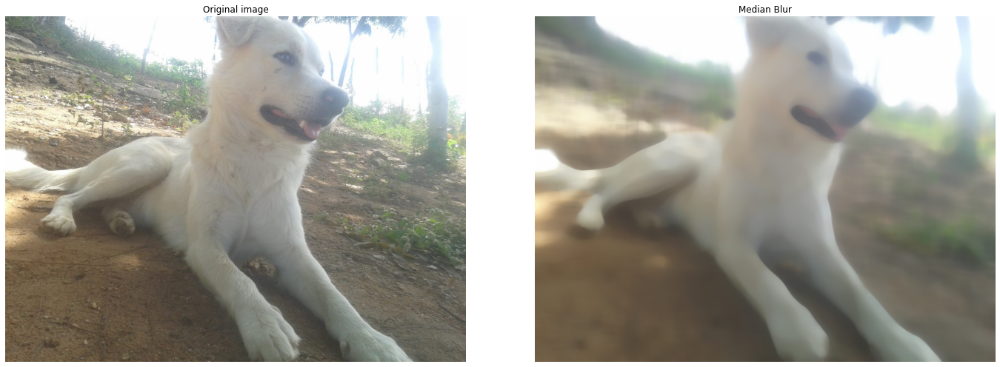

In [3]:
# Carregando a imagem
image = cv2.imread("images/toddy4.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_medianBlur()

In [4]:
# Interação no Jupyter
interact_manual(show_medianBlur, ksize = (1, 71, 2))

interactive(children=(IntSlider(value=45, description='ksize', max=71, min=1, step=2), Button(description='Run…

<function __main__.show_medianBlur(ksize=45)>

###### 2.1.2 Gaussian Blur

O filtro Gaussian Blur é um dos filtros mais utilizados em processamento de imagens, ele utiliza principalmente a curva gaussiana com a distribuição em formato de sino.

Parâmetros da função cv2.GaussianBlur:

    src: Imagem de entrada
    ksize: Tamanho do kernel gaussiano. ksize.w e ksize.h podem ser diferentes, mas ambos devem ser positivos e ímpares (ou zeros se calculados a partir do sigma*).
    sigmaX: Desvio padrão do kernel gaussiano na direção X
    sigmaY: Desvio padrão do kernel gaussiano na direção Y; se sigmaY for zero, será igual a sigmaX.
    borderType: Método de extrapolação de pixel

In [5]:
def show_GaussianBlur(ksize = 35, sigmaX = 5.00):  
    # Imagem a ser passada
    global image
    
    # Chamada da função GaussianBlur pelo OpenCV
    blurred = cv2.GaussianBlur(image, ksize = (ksize, ksize), sigmaX = sigmaX) 
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(blurred)
    ax[1].set_title('Gaussian Blur')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

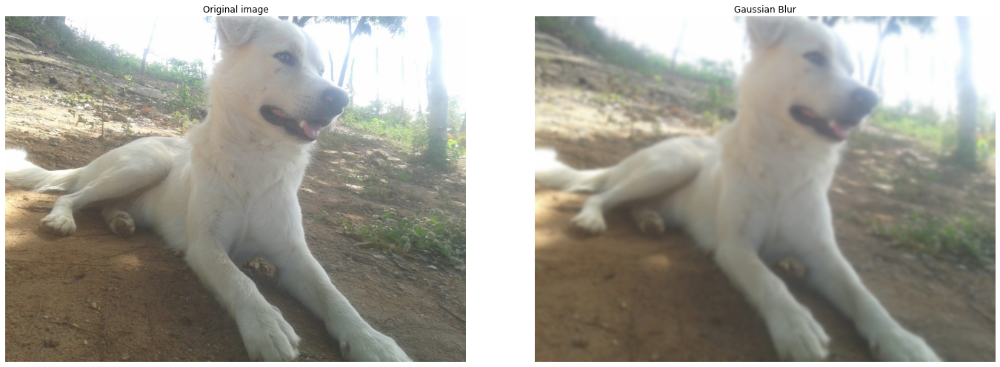

In [6]:
show_GaussianBlur()

In [7]:
# Interação no Jupyter
interact_manual(show_GaussianBlur, ksize = (1, 51, 2), sigmaX = (0.1, 10.0, 0.1))

interactive(children=(IntSlider(value=35, description='ksize', max=51, min=1, step=2), FloatSlider(value=5.0, …

<function __main__.show_GaussianBlur(ksize=35, sigmaX=5.0)>

###### 2.1.3 Mean Shift Filter

O filtro Mean Shift Filter (deslocamento médio) realiza a etapa inicial de uma segmentação de deslocamento de uma imagem

Parâmetros da função cv2.pyrMeanShiftFiltering:

    src: Imagem de entrada
    dst: A imagem de destino do mesmo formato e tamanho da origem.
    sp – O raio da janela espacial.
    sr – O raio da janela de cores.
    maxLevel – Nível máximo da pirâmide para a segmentação.
    termcrit – Critérios de encerramento: quando parar as iterações de desvio médio.

In [8]:
def show_MeanShift(spatialWindow = 21, colorWindow = 51):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função pyrMeanShiftFiltering pelo OpenCV
    shifted = cv2.pyrMeanShiftFiltering(image, sp=spatialWindow, sr=colorWindow)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(shifted)
    ax[1].set_title('Mean Shift')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

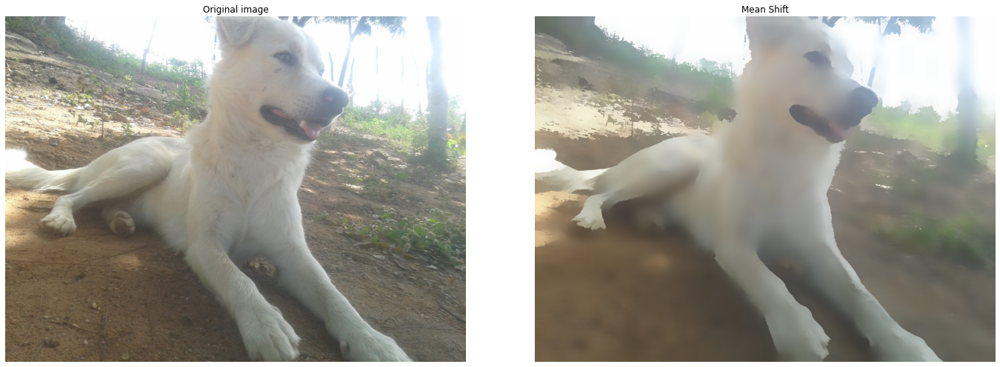

In [9]:
show_MeanShift()

In [10]:
# Interação no Jupyter
interact_manual(show_MeanShift, spatialWindow = (1, 51, 2), colorWindow = (1, 101, 2))

interactive(children=(IntSlider(value=21, description='spatialWindow', max=51, min=1, step=2), IntSlider(value…

<function __main__.show_MeanShift(spatialWindow=21, colorWindow=51)>

### 2.2 Transformações Morfólogicas

###### 2.2.1 Erode

O filtro Erode (Erosão) tem como objetivo remover partes de uma imagem, quando aplicamos a erosão os objetos que estão na imagem diminuem. Com isso, o principal objetivo da erosão é a remoção de ruídos e a de atributos que não interessantes para a aplicação em uma determinada imagem.

Parâmetros da função cv2.Erode:

    src: Imagem de entrada
    kernel: Elemento estruturante do kernel que será utilizado na erosão
    iterations: Número de interações que a erosão será aplicada

In [11]:
def show_Erode(i = 3):
    
    # Imagem a ser passada
    global image
    
    # criando um elemento estruturante de tamanho 3x3
    kernel = np.ones((3, 3), np.uint8)
    
    # Aplicando a Erosão
    erode = cv2.erode(image, kernel, iterations=i)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(erode)
    ax[1].set_title('Erode')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

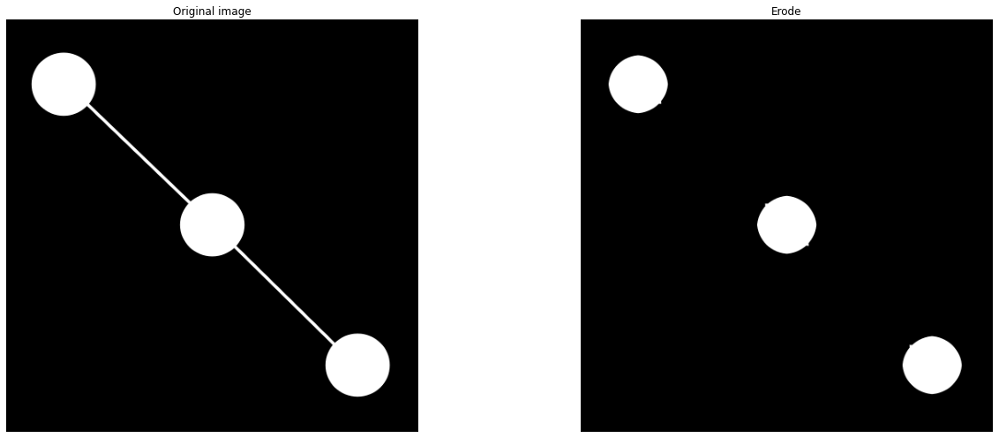

In [12]:
# Carregando a imagem
image = cv2.imread("images/ex1.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Erode()

In [13]:
# Interação no Jupyter
interact_manual(show_Erode, i = (1, 10, 1))

interactive(children=(IntSlider(value=3, description='i', max=10, min=1), Button(description='Run Interact', s…

<function __main__.show_Erode(i=3)>

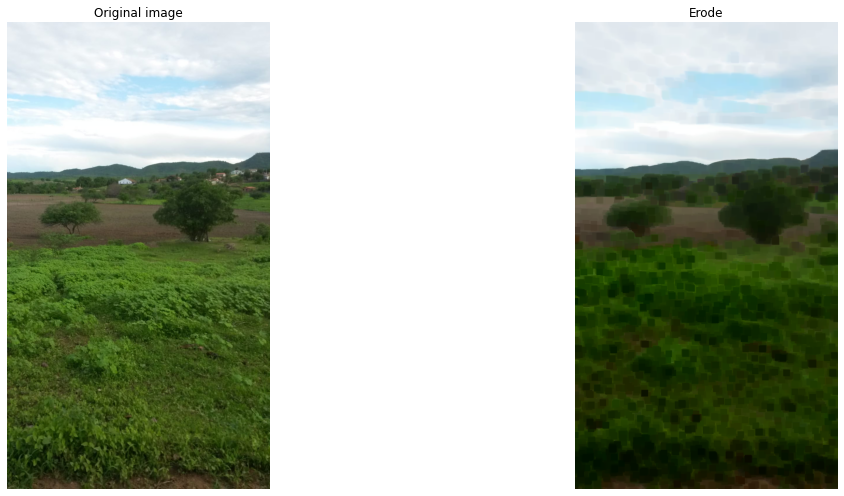

In [14]:
# Carregando a imagem
image = cv2.imread("images/image.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Erode(i = 10)

In [15]:
# Interação no Jupyter
interact_manual(show_Erode, i = (1, 30, 1))

interactive(children=(IntSlider(value=3, description='i', max=30, min=1), Button(description='Run Interact', s…

<function __main__.show_Erode(i=3)>

###### 2.2.2 Dilate

O filtro Dilate (Dilatação) é o oposto da erosão, basicamente tem como foco expandir as partes de uma determinada imagem. As principais aplicações da Dilatação são quando queremos dar um destaque maior em um determinado objeto fazendo que com que ele fique maior na imagem.

Parâmetros da função cv2.Dilate:

    src: Imagem de entrada
    kernel: Elemento estruturante do kernel que será utilizado na dilatação
    iterations: Número de interações que a dilatação será aplicada

In [16]:
def show_Dilate(i = 4):
    
    # Imagem a ser passada
    global image
    
    # criando um elemento estruturante de tamanho 3x3
    kernel = np.ones((3, 3), np.uint8)
    
    # Aplicando a Dilatação
    dilate = cv2.dilate(image, kernel, iterations=i)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(dilate)
    ax[1].set_title('Dilate')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

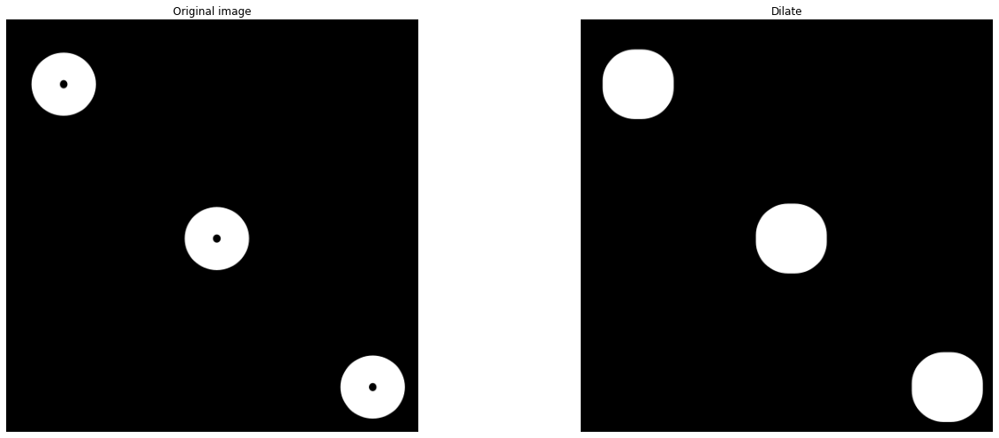

In [17]:
# Carregando a imagem
image = cv2.imread("images/ex2.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Dilate()

In [18]:
# Interação no Jupyter
interact_manual(show_Dilate, i = (1, 10, 1))

interactive(children=(IntSlider(value=4, description='i', max=10, min=1), Button(description='Run Interact', s…

<function __main__.show_Dilate(i=4)>

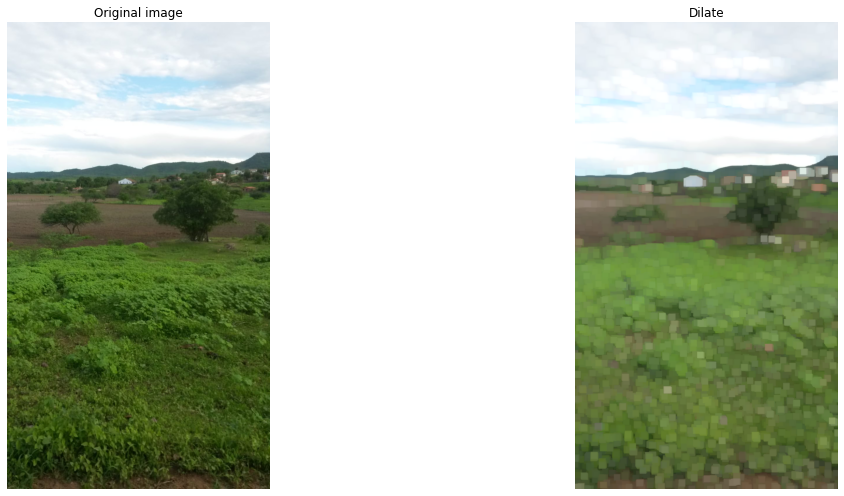

In [19]:
# Carregando a imagem
image = cv2.imread("images/image.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Dilate(i = 10)

In [20]:
# Interação no Jupyter
interact_manual(show_Dilate, i = (1, 30, 1))

interactive(children=(IntSlider(value=4, description='i', max=30, min=1), Button(description='Run Interact', s…

<function __main__.show_Dilate(i=4)>

###### 2.2.3 morphologyEx (Abertura, Fechamento, Gradiente e Top Heat)

O filtro morphologyEx possui diversas formas de fazer as manipulações, sendo elas:

    cv2.MORPH_OPEN: A Abertura basicamente é a junção da erosão com a dilatação e tem como objetivo suavizar o contorno de uma imagem.

    cv2.MORPH_CLOSE: O fechamento é o oposto da Abertura, tem como objetivo fundir pequenas quebras de orificios e também preencher ou fechar os vazios.

    cv2.MORPH_GRADIENT: O Gradiente é a diferença entre dilatação e erosão de uma imagem. O resultado será semelhante ao contorno do objeto.

    cv2.MORPH_TOPHAT: O TopHat é a diferença entre a imagem de entrada e a abertura da imagem.

In [21]:
def show_Morphology(morph):
    
    # Imagem a ser passada
    global image
    
    # criando um elemento estruturante de tamanho 5x5
    kernel = np.ones((5, 5), np.uint8)
    
    # Aplicando a morphologyEx
    morphology = cv2.morphologyEx(image, morph, kernel)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(morphology)
    ax[1].set_title('Morphology')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

In [22]:
# Carregando a imagem
image = cv2.imread("images/ex1.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

morphs = [('Abertura', cv2.MORPH_OPEN), ('Fechamento', cv2.MORPH_CLOSE), 
          ('Gradiente', cv2.MORPH_GRADIENT), ('Top Hat', cv2.MORPH_TOPHAT)]
   
# Interação no Jupyter
interact_manual(show_Morphology, morph=morphs)

interactive(children=(Dropdown(description='morph', options=(('Abertura', 2), ('Fechamento', 3), ('Gradiente',…

<function __main__.show_Morphology(morph)>

### 2.3 Thresholding

###### 2.3.1 Threshold simples

O Threshold simples substitui cada pixel da imagem por um pixel preto se a intensidade da imagem for menor que um valor fixo chamado de limiar.

Parâmetros da função cv2.threshold:

    src: Imagem de entrada
    thresh: Valor mínimo do threshold (0-255)
    maxval: Valor máximo do Threshold (0255)
    type: Modo do threshold que será utilizado (THRESH_BINARY, THRESH_BINARY_INV & cv2.THRESH_OTSU)

In [23]:
def show_Threshold(min_thresh, max_thresh, mode=cv2.THRESH_BINARY):
    
    # Imagem a ser passada
    global image
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Suavização da imagem para remoção de bordas de alta frequência
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    
    # Threshold na imagem
    (T, thresh) = cv2.threshold(blurred, min_thresh, max_thresh, mode)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1, ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(thresh, cmap='gray')
    
    ax[1].set_title(f'Threshold')  
        
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

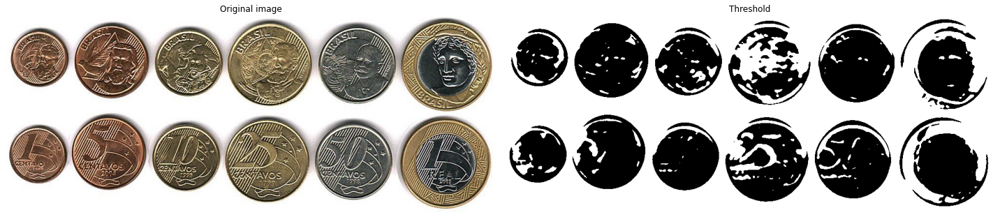

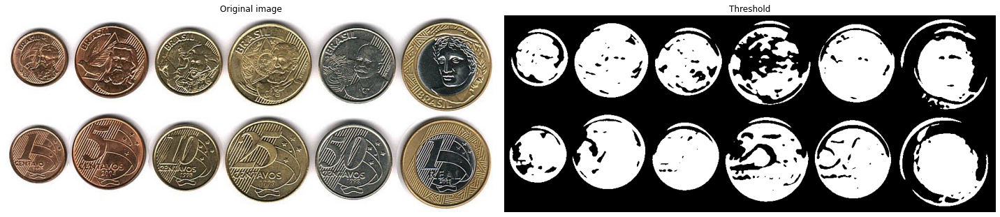

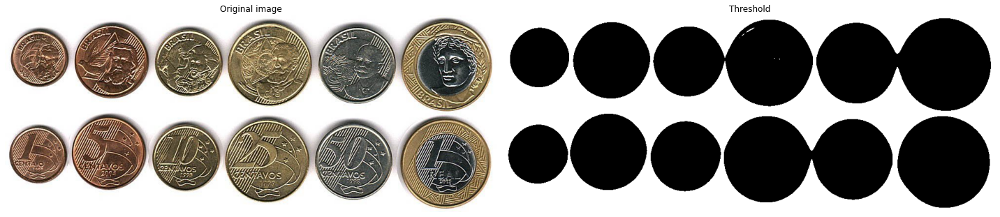

In [24]:
# Carregando a imagem
image = cv2.imread("images/moedas.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Binary
show_Threshold(120, 255)

# Inv
show_Threshold(120, 255, cv2.THRESH_BINARY_INV)

# Otsu
show_Threshold(120, 255, cv2.THRESH_OTSU)

In [25]:
thresh_mode = [('Threshold Padrão', cv2.THRESH_BINARY), ('Threshold Invertido', cv2.THRESH_BINARY_INV), 
               ('Otsu', cv2.THRESH_OTSU)]
   
# Interação no Jupyter
interact_manual(show_Threshold, min_thresh = (0, 255, 1), max_thresh = (0, 255, 1), mode=thresh_mode)

interactive(children=(IntSlider(value=127, description='min_thresh', max=255), IntSlider(value=127, descriptio…

<function __main__.show_Threshold(min_thresh, max_thresh, mode=0)>

###### 2.3.2 Threshold Adaptativo

O Threshold simples pode não ser útil em todos os casos, um exemplo seria de uma imagem com diferentes condições de iluminação em diferentes áreas. Para isso temos o Threshold Adaptivo que obtém diferentes limiares de diferentes regiões da imagem, oferecendo resultados melhores para imagens com iluminação que variam.

Parâmetros da função cv2.adaptiveThreshold:

    src: Imagem de entrada com apenas um canal de cor (Gray Scale)
    maxValue: Elemento estruturante do kernel que será utilizado na dilatação
    adaptiveMethod: Método a ser utilizado
    thresholdType: Modo do threshold que será utilizado (THRESH_BINARY ou THRESH_BINARY_INV)
    blockSize: Tamanho de uma vizinhança de pixel que é usada para calcular um valor limite para o pixel: (3, 5, 7...)
    C: Constante subtraída da média ou média ponderada

In [26]:
def show_Threshold_Adaptative(adaptative, thresh_mode):
    
    # Imagem a ser passada
    global image
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Suavização da imagem para remoção de bordas de alta frequência
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    
    # Threshold na imagem
    thresh = cv2.adaptiveThreshold(blurred, 255, adaptative, thresh_mode, 11, 4)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1, ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(thresh, cmap='gray')
    ax[1].set_title('Threshold Adaptative')
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

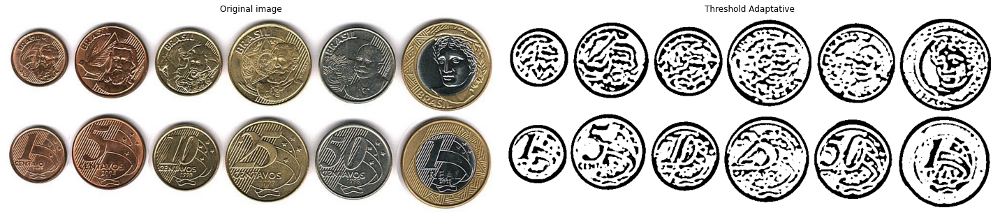

In [27]:
# Carregando a imagem
image = cv2.imread("images/moedas.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Threshold_Adaptative(adaptative=cv2.ADAPTIVE_THRESH_MEAN_C, thresh_mode=cv2.THRESH_BINARY)

In [28]:
adaptative_threshold = [('Threshold Mean', cv2.ADAPTIVE_THRESH_MEAN_C), ('Threshold Gaussian', cv2.ADAPTIVE_THRESH_GAUSSIAN_C)]
thresh_mode = [('Threshold Padrão', cv2.THRESH_BINARY), ('Threshold Invertido', cv2.THRESH_BINARY_INV)]
   
# Interação no Jupyter
interact_manual(show_Threshold_Adaptative, adaptative=adaptative_threshold, thresh_mode=thresh_mode)

interactive(children=(Dropdown(description='adaptative', options=(('Threshold Mean', 0), ('Threshold Gaussian'…

<function __main__.show_Threshold_Adaptative(adaptative, thresh_mode)>

### 2.4 Detecção de bordas

###### 2.4.1 Operador Sobel

O operador Sobel é um operador de detecção de bordas imagens que, basicamente seu processamento fornece a direção do aumento de intesidade (do claro ao escuro) e a taxa de alteração nessa direção e alica dois kernels sendo um na horizontal e outro na vertical.

Parâmetros da função cv2.Sobel:

    src: Imagem de entrada.
    ddepth: Profundidade da imagem de saída.
    dx: ordem dx da derivada x.
    dy: ordem dy da derivada y.

In [29]:
def show_Sobel(image):
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Computando os gradientes nos eixos X e Y  (transforma em float)
    gX = cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=1, dy=0)
    gY = cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=0, dy=1)

    # Conversão das imagens para int novamente
    gX = cv2.convertScaleAbs(gX)
    gY = cv2.convertScaleAbs(gY)

    # Combinação das representações Sobel dos eixos X e Y
    sobelCombined = cv2.addWeighted(gX, 0.5, gY, 0.5, 0)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 2, ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')
    
    ax[1].imshow(sobelCombined, cmap='gray')
    ax[1].set_title('Sobel Combinado')
    

    ax[2].imshow(gX, cmap='gray')
    ax[2].set_title('Sobel x')
    
    ax[3].imshow(gY, cmap='gray')
    ax[3].set_title('Sobel Y')
    
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

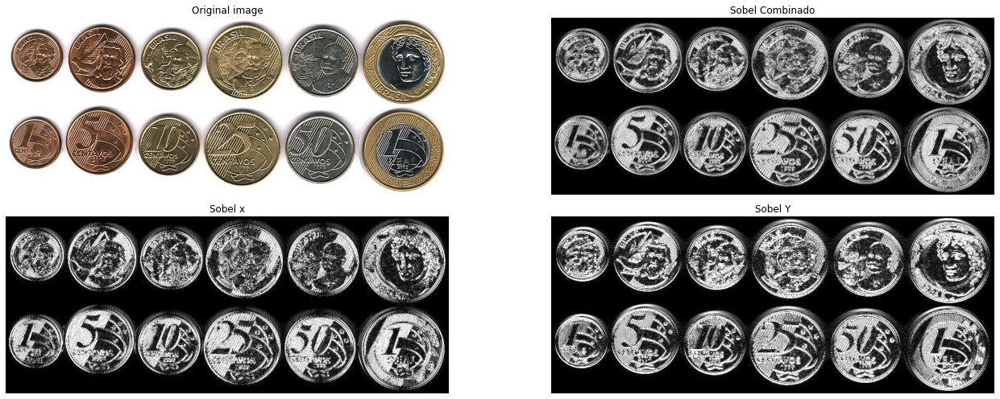

In [30]:
# Carregando a imagem
image = cv2.imread("images/moedas.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Sobel(image)

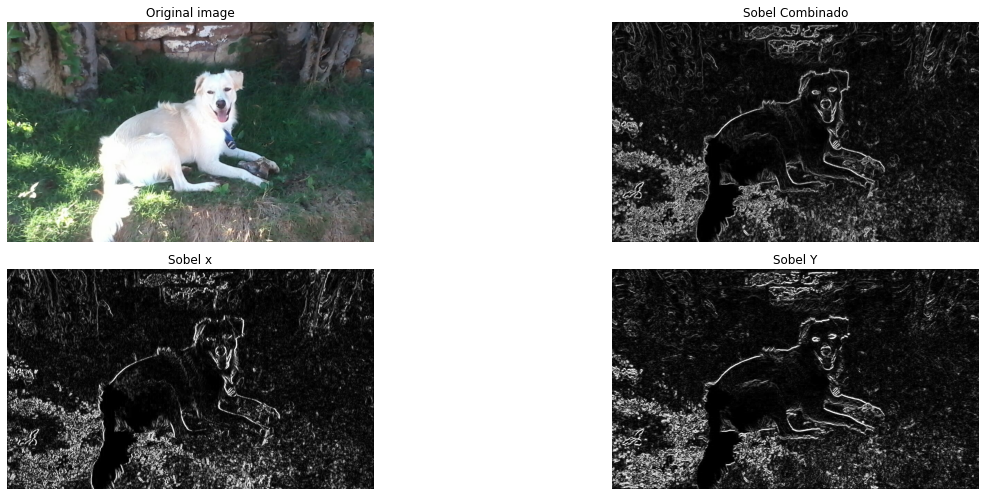

In [31]:
# Carregando a imagem
image = cv2.imread("images/toddy.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Sobel(image)

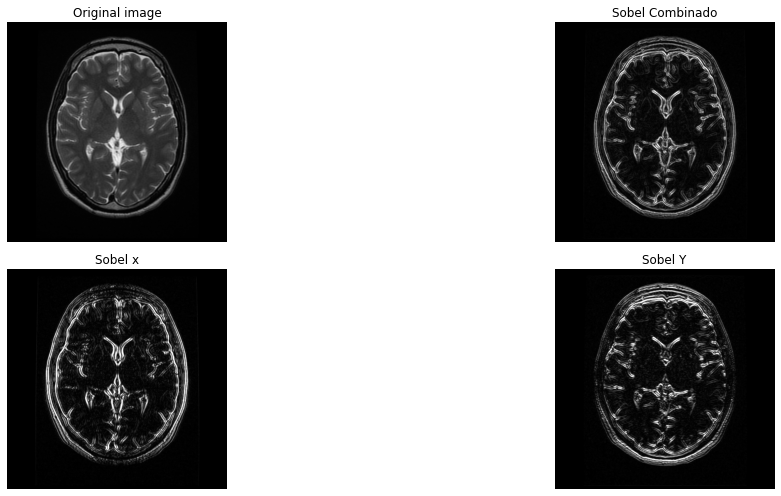

In [32]:
# Carregando a imagem
image = cv2.imread("images/brain.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Sobel(image)

In [33]:
def show_SobelMagOri(image):
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Computando os gradientes nos eixos X e Y  (transforma em float)
    gX = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    gY = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # Magnitude & Orientation
    magnitude = np.sqrt((gX ** 2) + (gY ** 2))
    orientation = np.arctan2(gY, gX) * (180 / np.pi) % 180
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1, ncols=3, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')
    
    ax[1].imshow(magnitude, cmap='jet')
    ax[1].set_title('Sobel Magnitude')
    
    ax[2].imshow(orientation, cmap='jet')
    ax[2].set_title('Sobel Orientation')
    
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

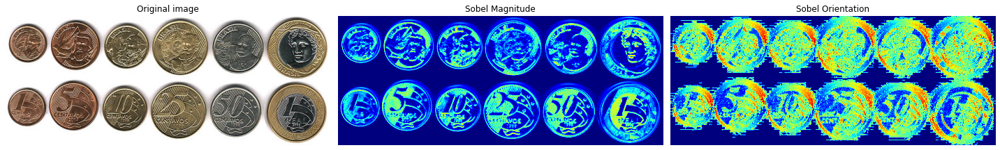

In [34]:
# Carregando a imagem
image = cv2.imread("images/moedas.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_SobelMagOri(image)

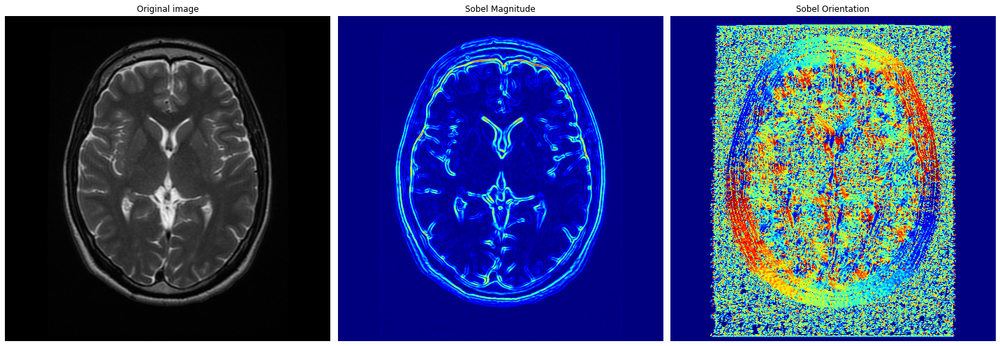

In [35]:
# Carregando a imagem
image = cv2.imread("images/brain.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_SobelMagOri(image)

###### 2.4.2 Operador Canny

O filtro de Canny é um filtro de convolução que suaviza o ruído e localiza bordas, combinando um operador diferencial com um filtro Gaussiano para calcular a intensidade dos gradientes. o filtro gaussiano reduz o efeito do ruído na imagem, em seguida, as bordas potenciais são reduzidas a curvas de 1 pixel, removendo pixels não máximos da magnitude do gradiente. Finalmente, os pixels de borda são mantidos ou removidos usando o limiar de histerese na magnitude do gradiente.

Parâmetros da função cv2.Canny:

    src: Imagem de entrada
    threshold1: Primeiro limiar para o procedimento de histerese
    threshold2: Segundo limiar para o procedimento de histerese

In [36]:
def show_Canny(image, threshold1=100, threshold2=500, apertureSize=3, L2gradient=True):
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função GaussianBlur pelo OpenCV
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Calcula um limite "wide", "mid-range" e "tight" para as bordas
    wide = cv2.Canny(blurred, 10, 200)
    mid = cv2.Canny(blurred, 30, 150)
    tight = cv2.Canny(blurred, 240, 250)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 2, ncols=2, figsize=(20,10), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')
    
    ax[1].imshow(wide, cmap='gray')
    ax[1].set_title('Wide')
    

    ax[2].imshow(mid, cmap='gray')
    ax[2].set_title('Mid')
    
    ax[3].imshow(tight, cmap='gray')
    ax[3].set_title('Tight')
    
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

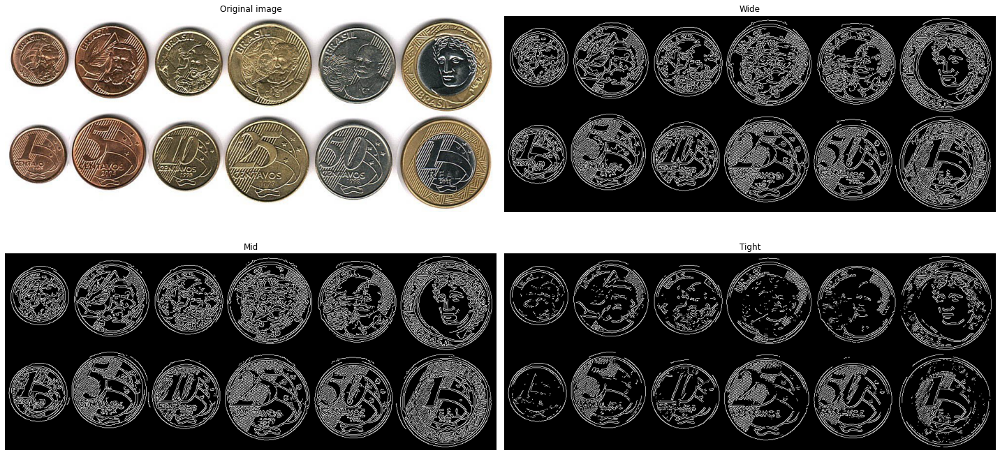

In [37]:
# Carregando a imagem
image = cv2.imread("images/moedas.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Canny(image)

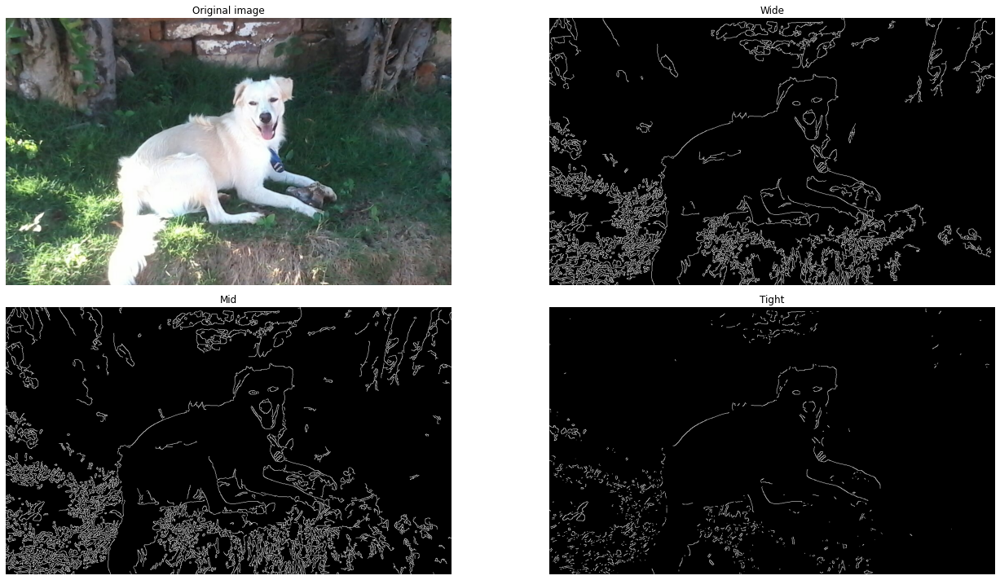

In [38]:
# Carregando a imagem
image = cv2.imread("images/toddy.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Canny(image)

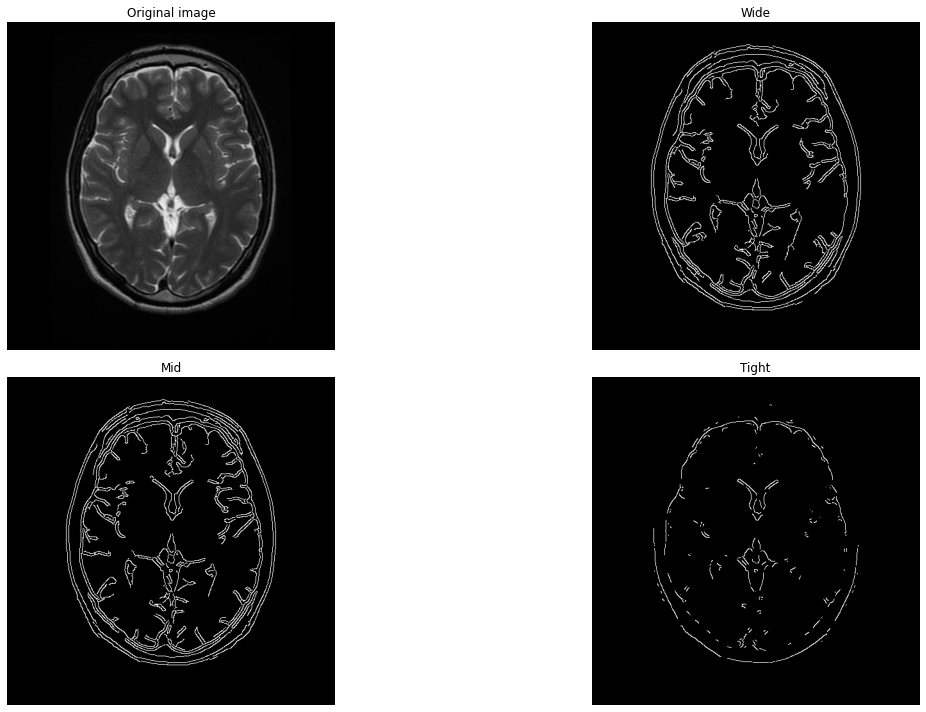

In [39]:
# Carregando a imagem
image = cv2.imread("images/brain.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Canny(image)

In [40]:
def cannyInteractive(threshold1,threshold2):
    
    global image
    
    # Chamda do detector de bordas Canny
    edges = cv2.Canny(image, threshold1=threshold1, threshold2=threshold2, apertureSize=3, L2gradient=True)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Input image')

    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny edges')

    for a in ax:
        a.set_axis_off()

    plt.tight_layout()
    plt.show()

In [41]:
# Carregando a imagem
image = cv2.imread("images/brain.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

interact_manual(cannyInteractive, threshold1=(0, 100, 1),threshold2=(0, 500, 1))

interactive(children=(IntSlider(value=50, description='threshold1'), IntSlider(value=250, description='thresho…

<function __main__.cannyInteractive(threshold1, threshold2)>

###### 2.4.3 Detectando contornos

Parâmetros da função cv2.findContours:

    src: Imagem de entrada
    thresh: Valor mínimo do threshold (0-255)
    maxval: Valor máximo do Threshold (0255)
    type: Modo do threshold que será utilizado (THRESH_BINARY, THRESH_BINARY_INV & cv2.THRESH_OTSU)

In [42]:
def show_Contours(image):
    
    # Gray Scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função GaussianBlur pelo OpenCV
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Detector Canny
    edged = cv2.Canny(blurred, 30, 150)
    
    # Encontra os contornos da imagem
    (cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # A função findCountours faz alterações na imagem principal, logo irei fazer uma cópia da imagem
    clone = image.copy()

    # Desenha os contornos
    cv2.drawContours(clone, cnts, -1, [0, 255, 0], 4)
    print("Encontrados {} contornos".format(len(cnts)))
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Input image')

    ax[1].imshow(clone, cmap='gray')
    ax[1].set_title('Contours')
    
    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

Encontrados 129 contornos


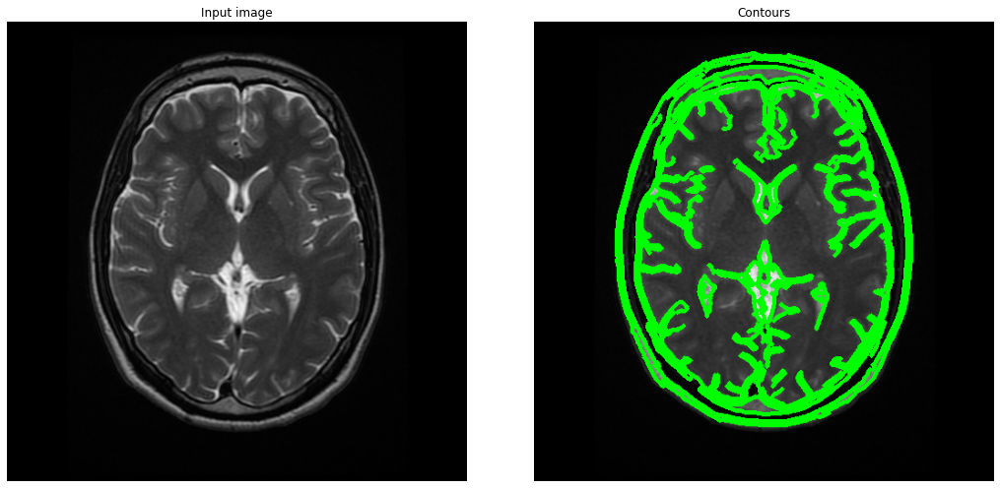

In [43]:
# Carregando a imagem
image = cv2.imread("images/brain.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Contours(image)

## 3. Referências

Filtros e atributos:

- https://www.youtube.com/watch?v=mSb_rGWfeWM&list=PLmDIGfkfgKy1SBjXA0kBk4DAhIaN1vQOS&index=5&ab_channel=AldovonWangenheim


- https://lapix.ufsc.br/ensino/visao/

Transformações Morfólogicas:

- https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_morphological_ops/py_morphological_ops.html


- https://github.com/dev4lab/cookbook/blob/master/capitulos/cap2.md

Thresholding:

- https://en.wikipedia.org/wiki/Thresholding_(image_processing)


- https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

Detecção de bordas:

- https://www.youtube.com/watch?v=4v8Pyn45Els&list=PLmDIGfkfgKy1SBjXA0kBk4DAhIaN1vQOS&index=7&ab_channel=AldovonWangenheim


- https://github.com/dev4lab/cookbook/blob/master/capitulos/cap1.md


- https://docs.opencv.org/4.x/d4/d73/tutorial_py_contours_begin.html


- https://pyimagesearch.com/2021/05/12/image-gradients-with-opencv-sobel-and-scharr/